# Bumblebee Classification
## Imports and Initial Variables

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import seaborn as sns

from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.utils import class_weight

SEED = 1234
tf.random.set_seed(1234)

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

FOLDER_DIR = 'D:\Jen\Documents\Dissertation\Bee_Data_UK\Weights2'

## Load Datasets

In [48]:
def one_hot_map(image, label):
    label = tf.one_hot(label, 19)
    return (image, label)

def get_class_weights(train_dataset):
    x_train_i = 0
    y_train_i = 0
    first_run = True

    for images, labels in train_dataset.take(tf.data.experimental.cardinality(train_dataset)):
        if first_run:
            #x_train = extrac
            y_train_i = labels
            first_run = False
        else:
            #x_train = np.concatenate((x_train, extrac), axis=0)
            y_train_i = np.concatenate([y_train_i, labels])
    
    class_weights = class_weight.compute_class_weight('balanced',
                                        np.unique(y_train_i),
                                            y_train_i)
    return dict(enumerate(class_weights))

train_dataset = image_dataset_from_directory(FOLDER_DIR+'\Train',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
test_dataset = image_dataset_from_directory(FOLDER_DIR+'\Test',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
validation_dataset = image_dataset_from_directory(FOLDER_DIR+'\Validation',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
class_names = train_dataset.class_names
class_weights = get_class_weights(train_dataset)

train_dataset = train_dataset.map(one_hot_map)
test_dataset = test_dataset.map(one_hot_map)
validation_dataset = validation_dataset.map(one_hot_map)

# *Enable if corrupt images need to be ignored*
#train_dataset = train_dataset.apply(tf.data.experimental.ignore_errors())
#test_dataset = test_dataset.apply(tf.data.experimental.ignore_errors())
#validation_dataset = validation_dataset.apply(tf.data.experimental.ignore_errors())

AUTOTUNE = tf.data.experimental.AUTOTUNE # Buffered prefetching for loading images (https://www.tensorflow.org/guide/data_performance)
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

Found 18609 files belonging to 19 classes.
Found 6209 files belonging to 19 classes.
Found 6192 files belonging to 19 classes.
C:\Users\Jen\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass classes=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18], y=[17  0 17 ...  6  4 13] as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


Show a sample of images from the training set:

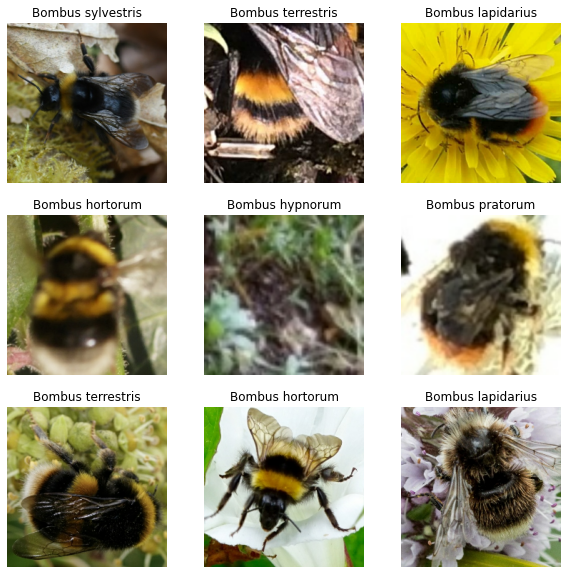

In [4]:
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis("off")

In [3]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

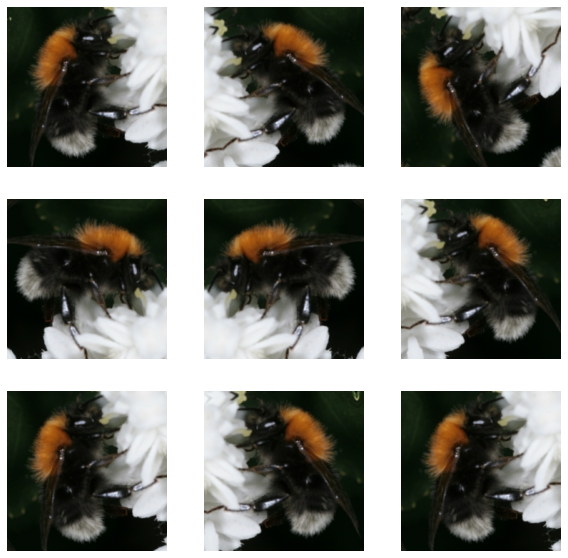

In [9]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

## Build the Model

In [4]:
preprocess_input = tf.keras.applications.resnet50.preprocess_input

# Create the base model from the pre-trained ResNew50 Model
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.ResNet50(
    input_shape=IMG_SHAPE, include_top=False, weights='imagenet'
)
base_model.trainable = False

inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False) # Training=False will keep the batch normalization layers frozen when we fine-tune
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2, seed=SEED)(x)
outputs = tf.keras.layers.Dense(19, activation='softmax')(x) # Coverts features into predictions
model = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top-3_accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top-5_accuracy')])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0     

## Train the Model


In [6]:
initial_epochs = 25

loss0, accuracy0, top30, top50 = model.evaluate(validation_dataset, verbose=0)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0*100))
print("initial top 3: {:.2f}".format(top30*100))
print("initial top 5: {:.2f}".format(top50*100))

checkpoint_path = 'D:/Jen/Documents/Dissertation/Checkpoints/UK_weights2'
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=0)
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset, 
                    class_weight=class_weights, 
                    callbacks=[es_callback, cp_callback])

initial loss: 3.63
initial accuracy: 8.01
initial top 3: 17.87
initial top 5: 27.51
Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Epoch 1/25
613/613 [==============================] - 1871s 3s/step - loss: 3.0255 - accuracy: 0.1619 - top-3_accuracy: 0.3629 - top-5_accuracy: 0.5093 - val_loss: 2.2726 - val_accuracy: 0.3231 - val_top-3_accuracy: 0.5751 - val_top-5_accuracy: 0.7010
Epoch 2/25
613/613 [==============================] - 1882s 3s/step - loss: 2.5095 - accuracy: 0.3113 - top-3_accuracy: 0.5626 - top-5_accuracy: 0.6947 - val_loss: 2.0565 - val_accuracy: 0.3918 - val_top-3_accuracy: 0.6457 - val_top-5_accuracy: 0.7611
Epoch 3/25
613/613 [==============================] - 1871s 3s/step - loss: 2.2365 - accuracy: 0.3710 - top-3_accuracy: 0.6277 - top-5_accuracy: 0.7547 - val_loss: 1.8297 - val_accuracy: 0.4649 - val_top-3_accuracy: 0.7160 - val_top-5_accuracy: 0.8268
Epoch 4/25
613/613 [==

## Evaluate the Model

In [7]:
loss_ev, accuracy_ev, top3_ev, top5_ev = model.evaluate(test_dataset, verbose=0)
print('Test loss :', loss_ev)
print('Test accuracy :', accuracy_ev * 100)
print('Test top-3 accuracy :', top3_ev * 100)
print('Test top-5 accuracy :', top5_ev * 100)

Test loss : 1.3068290948867798
Test accuracy : 60.41474938392639
Test top-3 accuracy : 83.62519145011902
Test top-5 accuracy : 90.64516425132751


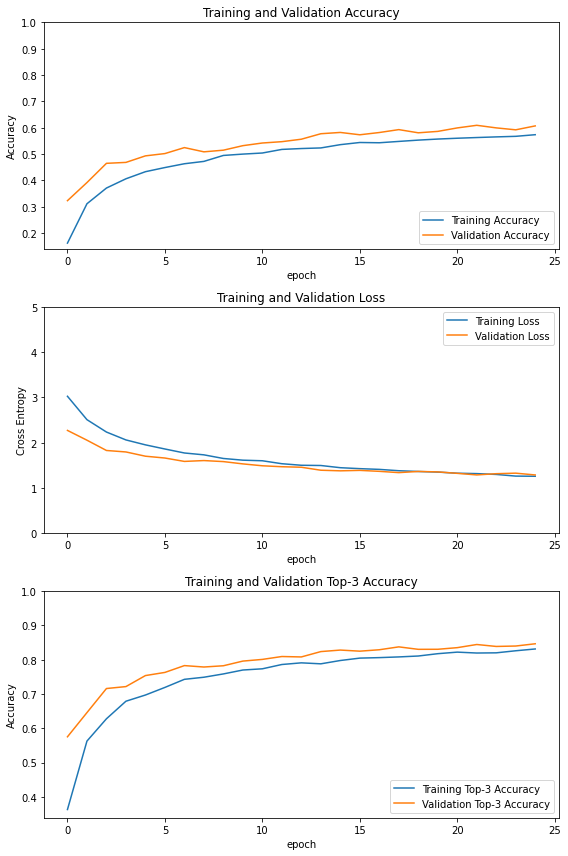

In [8]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

topk = history.history['top-3_accuracy']
val_topk = history.history['val_top-3_accuracy']

plt.figure(figsize=(8, 12))
plt.subplot(3, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.xlabel('epoch')
plt.title('Training and Validation Accuracy')

plt.subplot(3, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,5.0])
plt.xlabel('epoch')
plt.title('Training and Validation Loss')

#plt.figure(figsize=(8, 8))
plt.subplot(3, 1, 3)
plt.plot(topk, label='Training Top-3 Accuracy')
plt.plot(val_topk, label='Validation Top-3 Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.xlabel('epoch')
plt.title('Training and Validation Top-3 Accuracy')
plt.tight_layout()
plt.show()

Note: If you are wondering why the validation metrics are clearly better than the training metrics, the main factor is because layers like `tf.keras.layers.BatchNormalization` and `tf.keras.layers.Dropout` affect accuracy during training. They are turned off when calculating validation loss.

To a lesser extent, it is also because training metrics report the average for an epoch, while validation metrics are evaluated after the epoch, so validation metrics see a model that has trained slightly longer.

## Fine-Tuning of Model

In [9]:
base_model.trainable = True
print("Number of layers in the base model: ", len(base_model.layers))
# Fine-tune from this layer onwards
fine_tune_at = 81
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True), optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10), metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top-3_accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top-5_accuracy')])

model.summary()

Number of layers in the base model:  175
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)   

In [10]:
fine_tune_epochs = 15
total_epochs =  initial_epochs + fine_tune_epochs
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)
history_fine = model.fit(train_dataset,
                    epochs=total_epochs,
                    initial_epoch=history.epoch[-1],
                    validation_data=validation_dataset, 
                    class_weight=class_weights, 
                    callbacks=[es_callback, cp_callback])

Epoch 25/40
613/613 [==============================] - 3834s 6s/step - loss: 1.2654 - accuracy: 0.6040 - top-3_accuracy: 0.8532 - top-5_accuracy: 0.9204 - val_loss: 1.1143 - val_accuracy: 0.6492 - val_top-3_accuracy: 0.8746 - val_top-5_accuracy: 0.9340

Epoch 00025: saving model to D:/Jen/Documents/Dissertation/Checkpoints\UK_weights2
Epoch 26/40
613/613 [==============================] - 3783s 6s/step - loss: 1.0680 - accuracy: 0.6610 - top-3_accuracy: 0.8813 - top-5_accuracy: 0.9394 - val_loss: 0.9175 - val_accuracy: 0.7177 - val_top-3_accuracy: 0.9034 - val_top-5_accuracy: 0.9461

Epoch 00026: saving model to D:/Jen/Documents/Dissertation/Checkpoints\UK_weights2
Epoch 27/40
613/613 [==============================] - 3733s 6s/step - loss: 0.9232 - accuracy: 0.6964 - top-3_accuracy: 0.9029 - top-5_accuracy: 0.9523 - val_loss: 0.8799 - val_accuracy: 0.7249 - val_top-3_accuracy: 0.9166 - val_top-5_accuracy: 0.9545

Epoch 00027: saving model to D:/Jen/Documents/Dissertation/Checkpoints\U

## Evaluate the Model

In [11]:
loss_ev, accuracy_ev, top3_ev, top5_ev = model.evaluate(test_dataset, verbose=0)
print('Test loss :', loss_ev)
print('Test accuracy :', accuracy_ev * 100)
print('Test top-3 accuracy :', top3_ev * 100)
print('Test top-5 accuracy :', top5_ev * 100)

Test loss : 0.7777654528617859
Test accuracy : 78.27957272529602
Test top-3 accuracy : 93.5944676399231
Test top-5 accuracy : 96.82027697563171


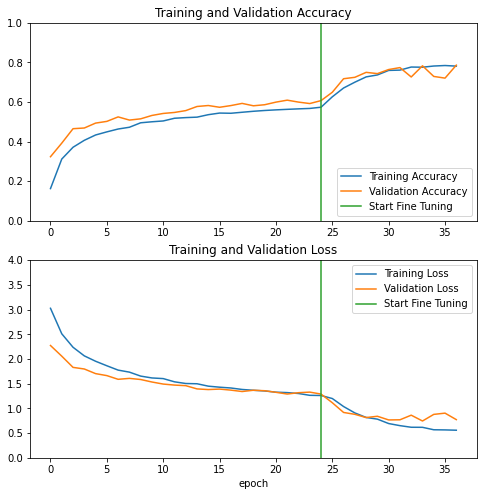

In [12]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 4.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

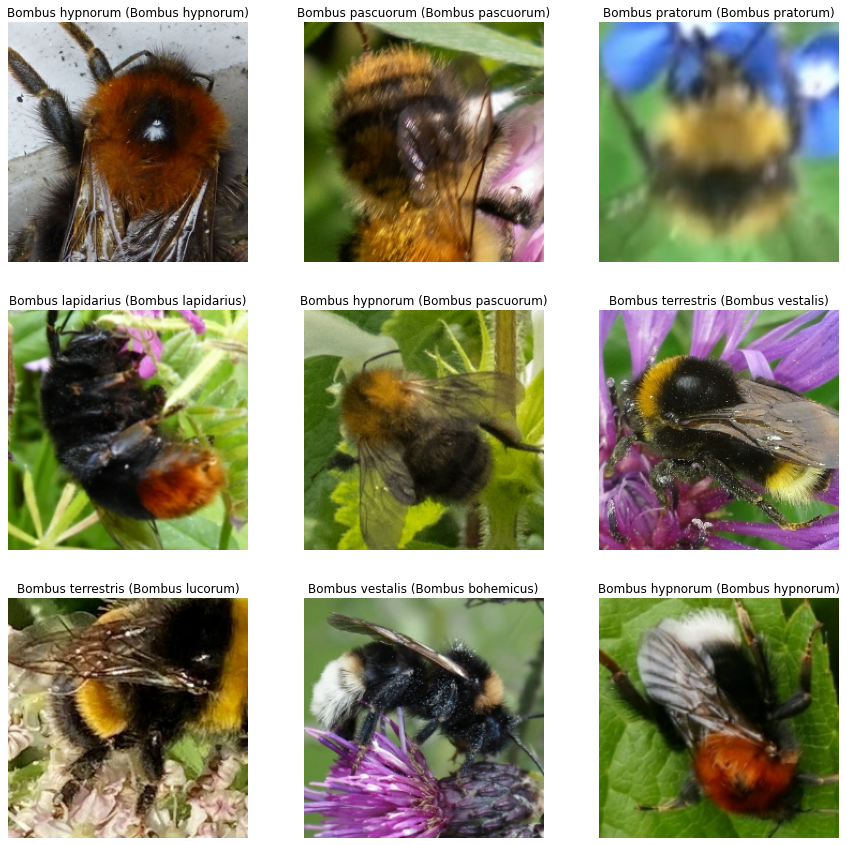

In [56]:
#Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

top_k = tf.math.top_k(
    predictions, k=3, sorted=True, name=None
)

predicted_indices = tf.argmax(predictions, 1)
predicted_class = tf.gather(class_names, predicted_indices)

plt.figure(figsize=(15, 15))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predicted_indices[i]] + " (" + class_names[label_batch[i]] + ")")
  plt.axis("off")

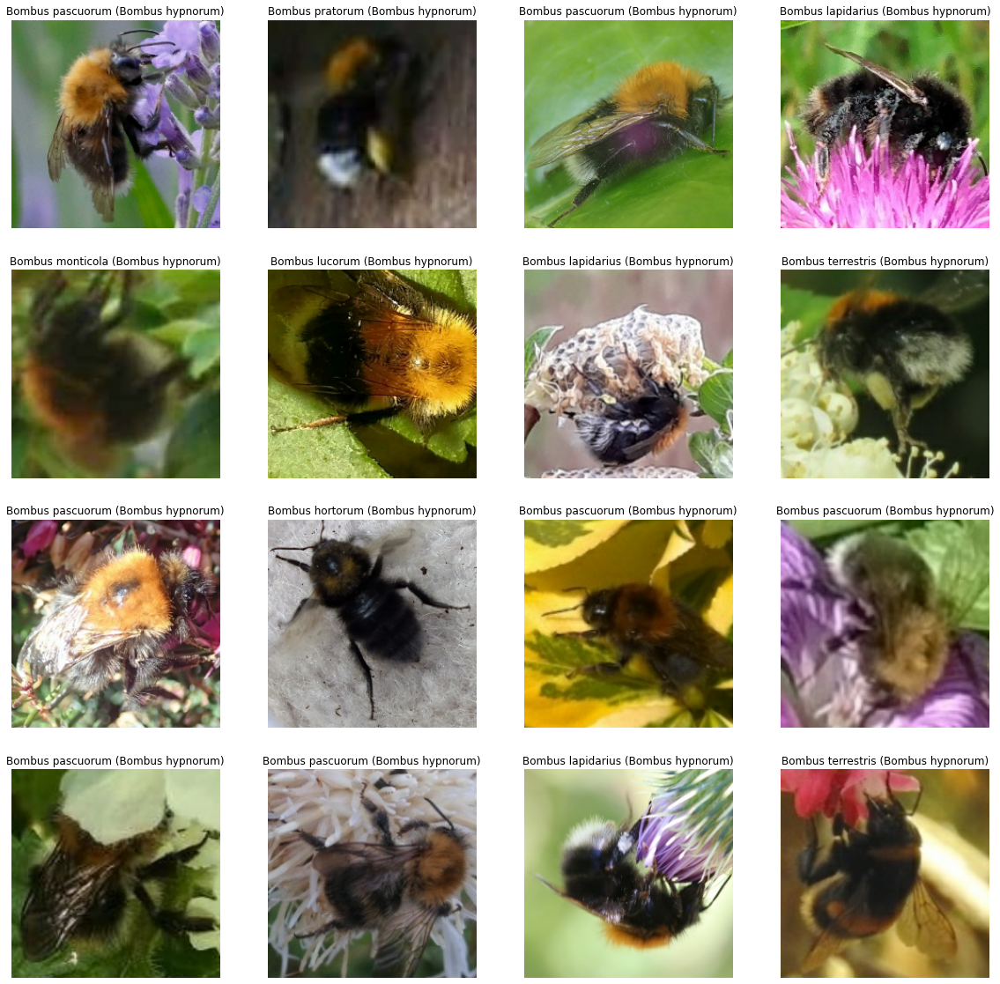

In [46]:
i = 0
plt.figure(figsize=(20, 20))
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    if i < 16:
        pred = model.predict(images)
        index_values = tf.argmax(pred, 1)
        label_values = tf.argmax(labels, 1) 
        for j in range(len(labels)):
            if i < 16 and index_values[j] != 5 and label_values[j] == 5:
                ax = plt.subplot(4, 4, i + 1)
                plt.imshow(images[j].numpy().astype("uint8"))
                plt.title(class_names[index_values[j]] + " (" + class_names[label_values[j]] + ")")
                plt.axis("off")
                i += 1

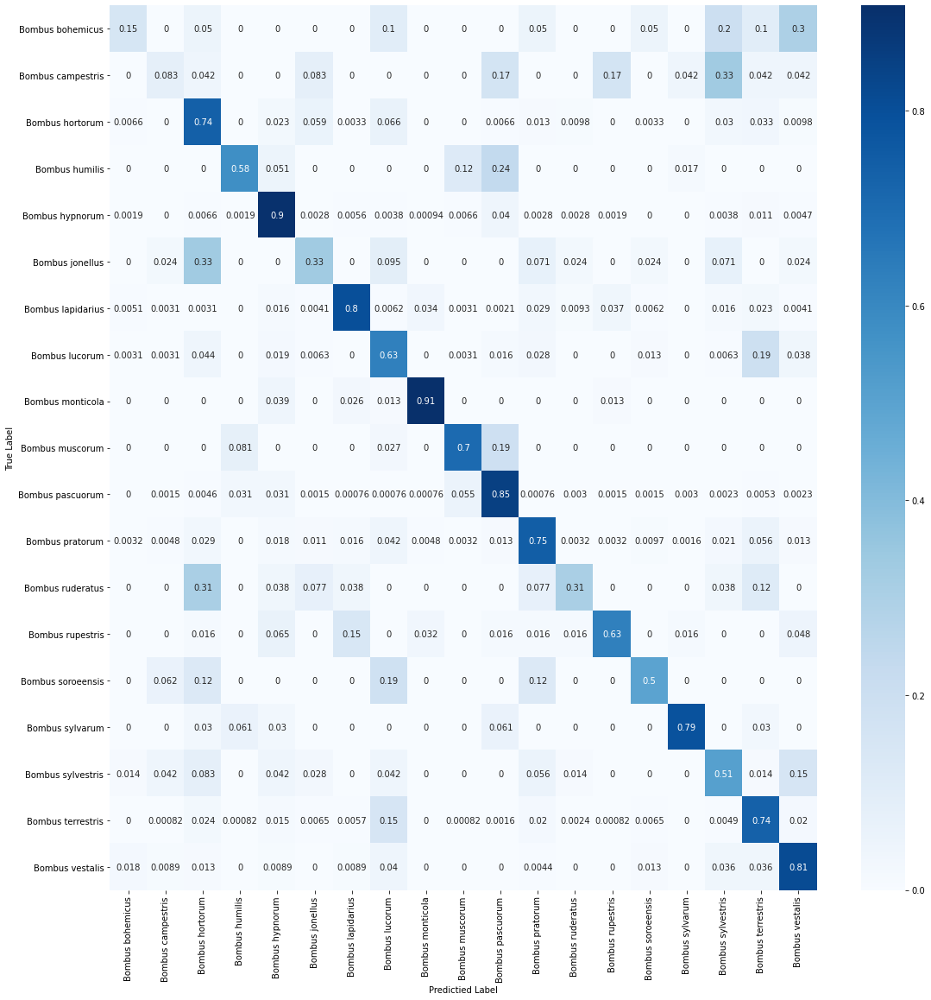

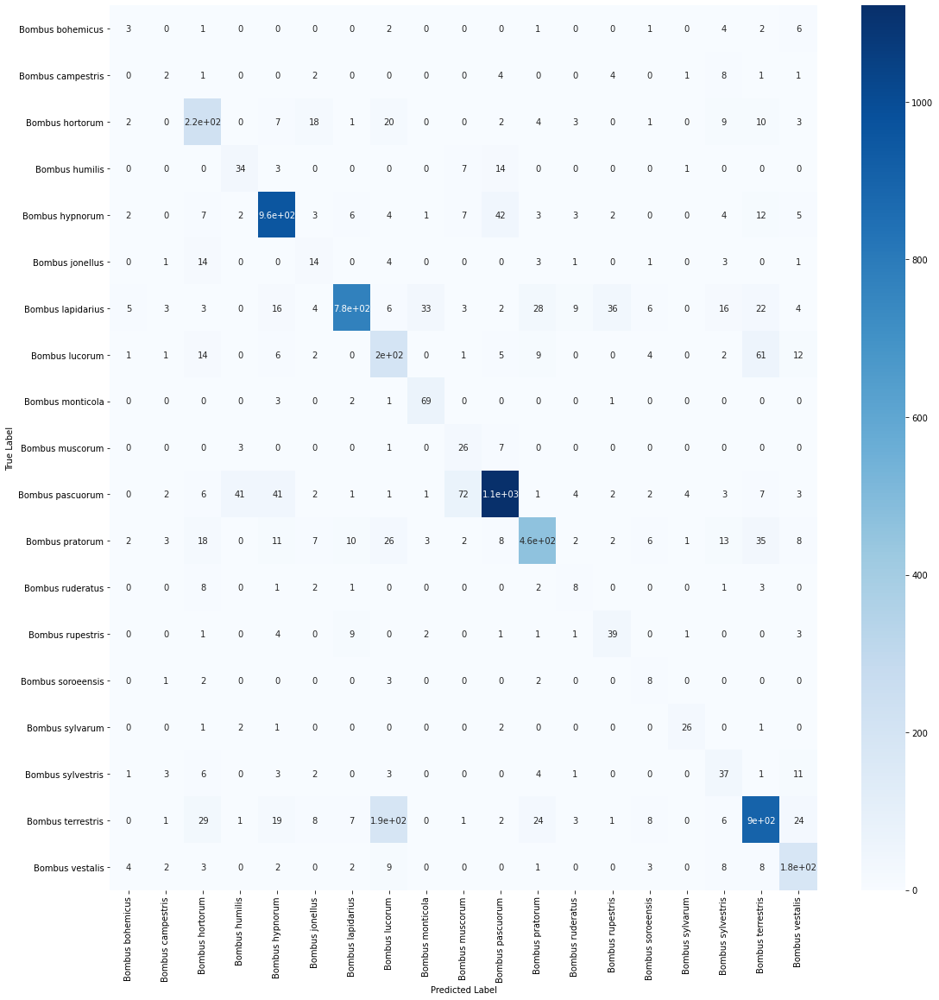

In [13]:
cm = [[0 for _ in range(19)] for _ in range(19)]
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    pred = model.predict(images)
    index_values = tf.argmax(pred, 1)
    index_labels = tf.argmax(labels, 1)
    conf = tf.math.confusion_matrix(index_labels, index_values, num_classes=19)
    cm = np.add(conf.numpy(), cm)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
figure = plt.figure(figsize=(16, 16))
sns.heatmap(cm_norm, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()
figure = plt.figure(figsize=(16, 16))
sns.heatmap(cm, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


In [61]:
x_test = 0
y_test = 0
first_run = True
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    extrac = tf.argmax(model.predict(images), 1)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x = extrac
        y = index_labels
        first_run = False
    else:
        x = np.concatenate((x, extrac), axis=0)
        y = np.concatenate([y, index_labels])
print(x.shape)
print(y.shape)

(5216,)
(5216,)


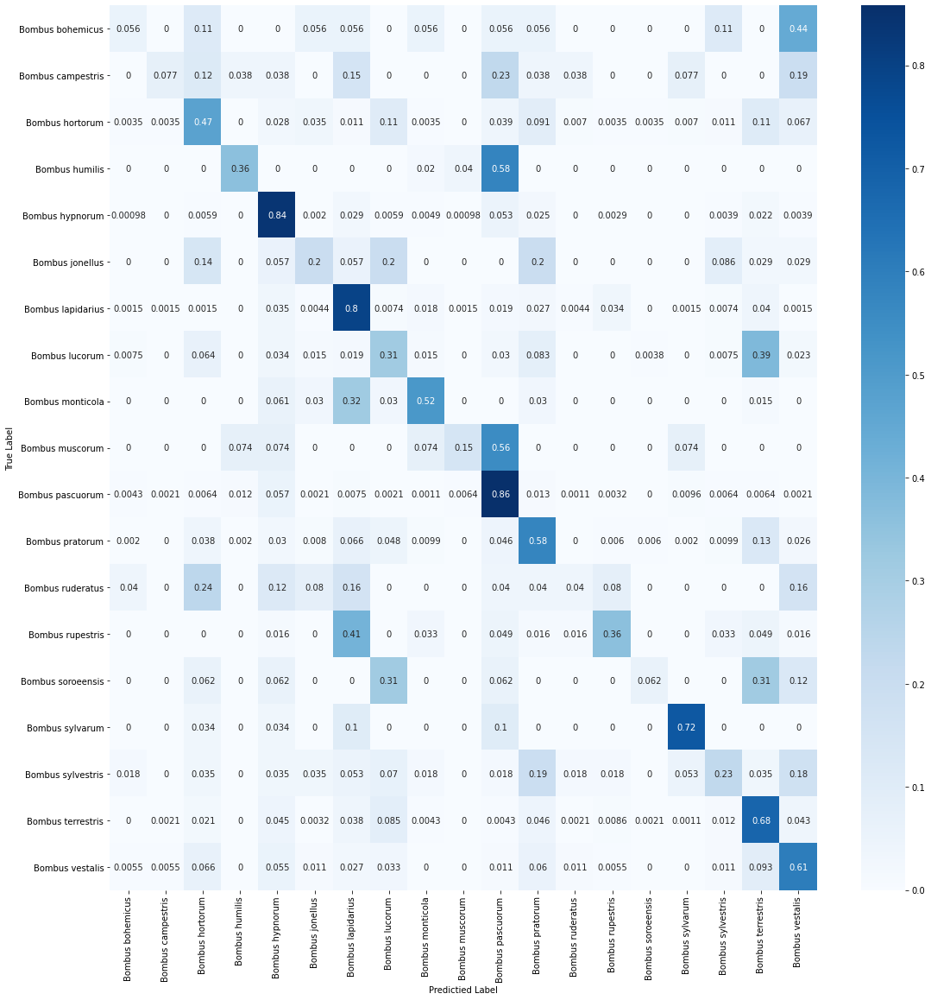

In [64]:
confusion = confusion_matrix(y, x, normalize='true')
figure = plt.figure(figsize=(16, 16))
sns.heatmap(confusion, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()

In [66]:
from sklearn.metrics import classification_report
report = classification_report(y,x,target_names=class_names)
print('Classification report : \n',report)

Classification report : 
                    precision    recall  f1-score   support

 Bombus bohemicus       0.07      0.06      0.06        18
Bombus campestris       0.22      0.08      0.11        26
  Bombus hortorum       0.57      0.47      0.52       285
   Bombus humilis       0.55      0.36      0.43        50
  Bombus hypnorum       0.83      0.84      0.83      1022
  Bombus jonellus       0.16      0.20      0.18        35
Bombus lapidarius       0.75      0.80      0.77       679
   Bombus lucorum       0.33      0.31      0.32       266
 Bombus monticola       0.47      0.52      0.49        66
  Bombus muscorum       0.29      0.15      0.20        27
 Bombus pascuorum       0.82      0.86      0.84       936
  Bombus pratorum       0.61      0.58      0.59       503
 Bombus ruderatus       0.07      0.04      0.05        25
 Bombus rupestris       0.33      0.36      0.34        61
Bombus soroeensis       0.12      0.06      0.08        16
  Bombus sylvarum       0.50 

In [16]:
model.save('D:/Jen/Documents/Dissertation/Serve_Models/UK_weights3_test.h5')

In [9]:
new_model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/Split_40_epochs')

# Check its architecture
new_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 20)                40980 

In [10]:
new_loss, new_acc, new_top3, new_top5 = new_model.evaluate(test_dataset)
print('Restored model, accuracy: {:5.2f}%'.format(100 * new_acc))

163/163 [==============================] - 356s 2s/step - loss: 1.0190 - sparse_categorical_accuracy: 0.6950 - sparse_top_k_categorical_accuracy: 0.8854
Restored model, accuracy: 69.50%


In [68]:
xall = 0
y = 0
first_run = True
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    extrac = model.predict(images)
    #index_labels = tf.argmax(labels, 1)
    if first_run:
        xall = extrac
        y = labels
        first_run = False
    else:
        xall = np.concatenate((xall, extrac), axis=0)
        y = np.concatenate([y, labels])
print(xall.shape)
print(y.shape)

(6256, 19)
(6256, 19)


In [70]:
import tensorflow_probability as tfp
ystd = np.float32(np.std(tf.argmax(y, 1), axis=0))
y32=np.float32(y)#tf.one_hot(y, 19))
print(-np.mean(tfp.distributions.Normal(y32,ystd).log_prob(xall)))

2.4864922


In [52]:
import tensorflow_probability as tfp
ystd = np.float32(np.std(y, axis=0))
y32=np.float32(tf.one_hot(y, 19))
print(-np.mean(tfp.distributions.Normal(y32,ystd).log_prob(xall)))

2.5810359


In [33]:
taken_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Bees_Taken',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
covered_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Bees_Covered',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)

Found 72 files belonging to 19 classes.
Found 72 files belonging to 19 classes.


In [36]:
taken_loss, taken_accuracy = model.evaluate(taken_dataset)
print('Taken accuracy :', taken_accuracy)
covered_loss, covered_accuracy = model.evaluate(covered_dataset)
print('Covered accuracy :', covered_accuracy)

3/3 [==============================] - 6s 1s/step - loss: 1.2479 - sparse_categorical_accuracy: 0.6250
Taken accuracy : 0.625
3/3 [==============================] - 5s 1s/step - loss: 3.0129 - sparse_categorical_accuracy: 0.0417
Covered accuracy : 0.0416666679084301


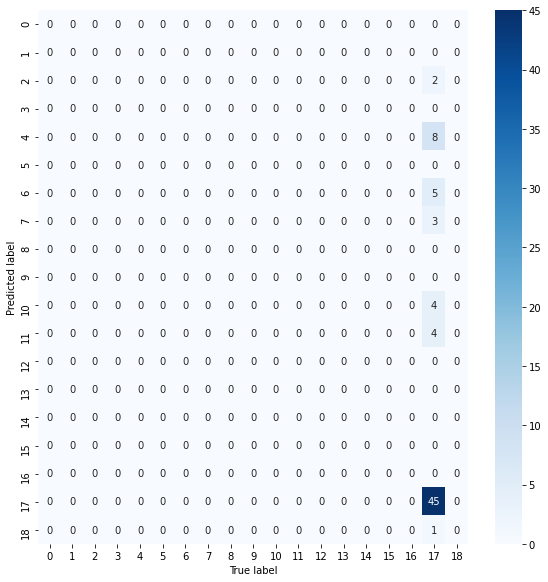

In [37]:
y_pred = model.predict(taken_dataset)
y_index_values = tf.argmax(y_pred, 1)
y_pred_class = tf.gather(class_names, y_index_values)
true_categories = tf.concat([y for x, y in taken_dataset], axis=0)
con_mat = tf.math.confusion_matrix(y_index_values, true_categories)
figure = plt.figure(figsize=(16, 16))
sns.heatmap(con_mat, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()

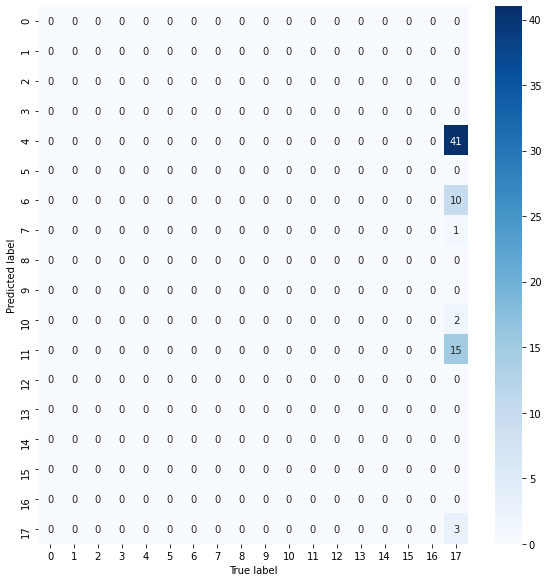

In [38]:
y_pred = model.predict(covered_dataset)
y_index_values = tf.argmax(y_pred, 1)
y_pred_class = tf.gather(class_names, y_index_values)
true_categories = tf.concat([y for x, y in covered_dataset], axis=0)
con_mat = tf.math.confusion_matrix(y_index_values, true_categories, num_classes=19)
figure = plt.figure(figsize=(8, 8))
sns.heatmap(con_mat, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('Predicted label')
plt.xlabel('True label')
plt.show()

In [16]:
img_url = "https://kerfdier.nl/wp-content/uploads/2019/08/20190726_krimpenaandenijssel_64-360x360.jpg"
img_path = tf.keras.utils.get_file('Bee3', origin=img_url)

img = tf.keras.preprocessing.image.load_img(
    img_path, target_size=IMG_SIZE
)
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

#prediction = model.predict(img_array)
extraction = extraction_model.predict(img_array)
#index = tf.argmax(prediction, 1).numpy()[0]
#print("Prediction: {}, with {:.2f} percent confidence."
    #.format(class_names[index], 100 * np.max(prediction)))
print(len(extraction[0]))

2048


In [13]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import seaborn as sns
from tensorflow.keras.preprocessing import image_dataset_from_directory

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

video_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Video_Cropped\VID (68)',
                                             shuffle=False,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
#new_model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/Split_40_epochs')

video_pred = new_model.predict(video_dataset)
vid_index_values = tf.argmax(video_pred, 1)
confidences = [0 for i in range(20)]
for i in range(len(vid_index_values)):
    print("Prediction: {}, with {:.2f} percent confidence."
    .format(class_names[vid_index_values[i]], 100 * np.max(video_pred[i])))
    confidences = np.add(video_pred[i], confidences)
#print(confidences)
final_index = np.argmax(confidences)
unique, counts = np.unique(vid_index_values, return_counts=True)
index_count = dict(zip(unique, counts))
print("Prediction: {}, with {:.2f} percent average confidence.".format(class_names[final_index], (100 * confidences[final_index] / index_count[final_index])))

Found 76 files belonging to 1 classes.
Prediction: Bombus hypnorum, with 39.29 percent confidence.
Prediction: Bombus hypnorum, with 60.62 percent confidence.
Prediction: Bombus monticola, with 46.32 percent confidence.
Prediction: Bombus lapidarius, with 52.40 percent confidence.
Prediction: Bombus lapidarius, with 30.77 percent confidence.
Prediction: Bombus lapidarius, with 75.04 percent confidence.
Prediction: Bombus lapidarius, with 88.11 percent confidence.
Prediction: Bombus lapidarius, with 61.61 percent confidence.
Prediction: Bombus lapidarius, with 50.27 percent confidence.
Prediction: Bombus lapidarius, with 50.74 percent confidence.
Prediction: Bombus lapidarius, with 38.63 percent confidence.
Prediction: Bombus lapidarius, with 69.66 percent confidence.
Prediction: Bombus lapidarius, with 74.34 percent confidence.
Prediction: Bombus lucorum, with 49.22 percent confidence.
Prediction: Bombus lapidarius, with 86.53 percent confidence.
Prediction: Bombus lapidarius, with 46.

In [3]:
new_model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights2')
extraction_model = tf.keras.Model(inputs=new_model.input, outputs=new_model.get_layer(index=5).output)
extraction_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
Total params: 23,587,712
Trainable params: 23,534,592
Non-trainable params: 53,120
____________________________________________

In [3]:
new_model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights2')
base_learning_rate = 0.0001
new_model.layers[6].activation=None
new_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True), optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10), metrics=[tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.TopKCategoricalAccuracy(k=3)])
new_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0     

In [16]:
base_learning_rate = 0.0001
model.layers[6].activation=None
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True), optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10), metrics=[tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.TopKCategoricalAccuracy(k=3)])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0     

In [32]:
extraction_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(index=5).output)
extraction_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
Total params: 23,587,712
Trainable params: 22,084,608
Non-trainable params: 1,503,104
_______________________________________

In [18]:
extraction_model.save('D:/Jen/Documents/Dissertation/Models/Extraction_Split_40_epochs')

INFO:tensorflow:Assets written to: D:/Jen/Documents/Dissertation/Models/Extraction_Split_40_epochs\assets


In [4]:
x_train = 0
y_train = 0
first_run = True
for images, labels in train_dataset.take(tf.data.experimental.cardinality(train_dataset)):
    extrac = extraction_model.predict(images)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x_train = extrac
        y_train = index_labels
        first_run = False
    else:
        x_train = np.concatenate((x_train, extrac), axis=0)
        y_train = np.concatenate([y_train, index_labels])
print(x_train.shape)
print(y_train.shape)

(18609, 2048)
(18609,)


In [5]:
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_train.csv", x_train, delimiter=",")
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_train.csv", y_train, delimiter=",")
x_train.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_train.np")
y_train.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_train.np")

In [33]:
x_val = 0
y_val = 0
first_run = True
for images, labels in validation_dataset.take(tf.data.experimental.cardinality(validation_dataset)):
    extrac = extraction_model.predict(images)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x_val = extrac
        y_val = index_labels
        first_run = False
    else:
        x_val = np.concatenate((x_val, extrac), axis=0)
        y_val = np.concatenate([y_val, index_labels])
print(x_val.shape)
print(y_val.shape)

(6192, 2048)
(6192,)


In [34]:
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_validation.csv", x_val, delimiter=",")
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_validation.csv", y_val, delimiter=",")
x_val.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_validation.np")
y_val.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_validation.np")

In [35]:
x_test = 0
y_test = 0
first_run = True
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    extrac = extraction_model.predict(images)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x_test = extrac
        y_test = index_labels
        first_run = False
    else:
        x_test = np.concatenate((x_test, extrac), axis=0)
        y_test = np.concatenate([y_test, index_labels])
print(x_test.shape)
print(y_test.shape)

(6209, 2048)
(6209,)


In [36]:
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_test.csv", x_test, delimiter=",")
np.savetxt("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_test.csv", y_test, delimiter=",")
x_test.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_X_test.np")
y_test.tofile("D:/Jen/Documents/Dissertation/Outputs/Uk_weights2_Y_test.np")

In [9]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler 

print('Original dataset shape %s' % Counter(y_val))


sm = RandomOverSampler(random_state=1234)

x_res, y_res = sm.fit_resample(x_val, y_val)

print('Resampled dataset shape %s' % Counter(y_res))
print(x_res.shape)
print(y_res.shape)

Original dataset shape Counter({7: 1212, 17: 1108, 5: 982, 12: 726, 11: 712, 8: 348, 3: 328, 18: 234, 14: 92, 9: 76, 16: 74, 15: 60, 4: 54, 13: 50, 6: 44, 10: 42, 2: 40, 1: 38, 0: 34})
Resampled dataset shape Counter({3: 1212, 7: 1212, 12: 1212, 5: 1212, 17: 1212, 18: 1212, 11: 1212, 8: 1212, 16: 1212, 9: 1212, 0: 1212, 15: 1212, 1: 1212, 6: 1212, 10: 1212, 14: 1212, 13: 1212, 4: 1212, 2: 1212})
(23028, 19)
(23028,)


In [10]:
from imblearn.under_sampling import RandomUnderSampler 

us = RandomUnderSampler(random_state=1234, sampling_strategy={0:320, 1:320, 2:320, 3:320, 4:320, 5:320, 6:320, 7:320, 8:320, 9:320, 10:320, 11:320, 12:320, 13:320, 14:320, 15:320, 16:320, 17:320, 18:320})

x_res, y_res = us.fit_resample(x_res, y_res)

print('Resampled dataset shape %s' % Counter(y_res))
print(x_res.shape)
print(y_res.shape)

Resampled dataset shape Counter({0: 320, 1: 320, 2: 320, 3: 320, 4: 320, 5: 320, 6: 320, 7: 320, 8: 320, 9: 320, 10: 320, 11: 320, 12: 320, 13: 320, 14: 320, 15: 320, 16: 320, 17: 320, 18: 320})
(6080, 19)
(6080,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_res, y_res, train_size=0.25)

In [20]:
from sklearn import svm
from sklearn.metrics import confusion_matrix

linear = svm.SVC(kernel='linear', C=1, decision_function_shape='ovo').fit(x_res, y_res)
rbf = svm.SVC(kernel='rbf', gamma=1, C=1, decision_function_shape='ovo').fit(x_res, y_res)
poly = svm.SVC(kernel='poly', degree=3, C=1, decision_function_shape='ovo').fit(x_res, y_res)
sig = svm.SVC(kernel='sigmoid', C=1, decision_function_shape='ovo').fit(x_res, y_res)

accuracy_lin = linear.score(x_test, y_test)
print("Accuracy Linear Kernel:", accuracy_lin)

accuracy_poly = poly.score(x_test, y_test)
print("Accuracy Polynomial Kernel:", accuracy_poly)

#accuracy_rbf = rbf.score(x_test, y_test)
#print("Accuracy Radial Basis Kernel:", accuracy_rbf)

#accuracy_sig = sig.score(x_test, y_test)
#print("Accuracy Sigmoid Kernel:", accuracy_sig)

Accuracy Linear Kernel: 0.6598926380368099
Accuracy Polynomial Kernel: 0.683282208588957
Accuracy Radial Basis Kernel: 0.21625766871165644
Accuracy Sigmoid Kernel: 0.39359662576687116


In [63]:
from sklearn import svm
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

linear = make_pipeline(StandardScaler(), svm.SVC(kernel='linear', C=1, decision_function_shape='ovo', probability=True))
rbf = make_pipeline(StandardScaler(), svm.SVC(kernel='rbf', gamma=1, C=1, decision_function_shape='ovo'))
poly = make_pipeline(StandardScaler(), svm.SVC(kernel='poly', degree=3, C=1, decision_function_shape='ovo'))
sig = make_pipeline(StandardScaler(), svm.SVC(kernel='sigmoid', C=1, decision_function_shape='ovo'))

linear.fit(x_res, y_res)
lin_pred = linear.predict(x_test)
print('Accuracy Linear Kernel: {:.2%}\n'.format(metrics.accuracy_score(y_test, lin_pred)))

#poly.fit(x_res, y_res)
#poly_pred = poly.predict(x_test)
#print('Accuracy Polynomial Kernel: {:.2%}\n'.format(metrics.accuracy_score(y_test, poly_pred)))

#rbf.fit(x_res, y_res)
#rbf_pred = rbf.predict(x_test)
#print('Accuracy Radial Basis Kernel: {:.2%}\n'.format(metrics.accuracy_score(y_test, rbf_pred)))

#sig.fit(x_res, y_res)
#sig_pred = sig.predict(x_test)
#print('Accuracy Sigmoid Kernel: {:.2%}\n'.format(metrics.accuracy_score(y_test, sig_pred)))

Accuracy Linear Kernel: 73.51%



model fit, hyperparameters:
[100**2 * RBF(length_scale=3.94), 69.1**2 * RBF(length_scale=3.83), 92.5**2 * RBF(length_scale=4.19), 35.9**2 * RBF(length_scale=2.92), 60.2**2 * RBF(length_scale=3.57), 16.1**2 * RBF(length_scale=6.88), 85.1**2 * RBF(length_scale=3.92), 22.6**2 * RBF(length_scale=3.72), 12.9**2 * RBF(length_scale=3.06), 75.7**2 * RBF(length_scale=4.96), 74.4**2 * RBF(length_scale=4.1), 36.7**2 * RBF(length_scale=3.3), 8.25**2 * RBF(length_scale=4.08), 63.6**2 * RBF(length_scale=3.49), 47.3**2 * RBF(length_scale=3.76), 79.7**2 * RBF(length_scale=4.9), 73.1**2 * RBF(length_scale=3.56), 9.4**2 * RBF(length_scale=8.68), 46.4**2 * RBF(length_scale=3.48)]
Accuracy Gaussian Process Classification: 0.6795076726342711


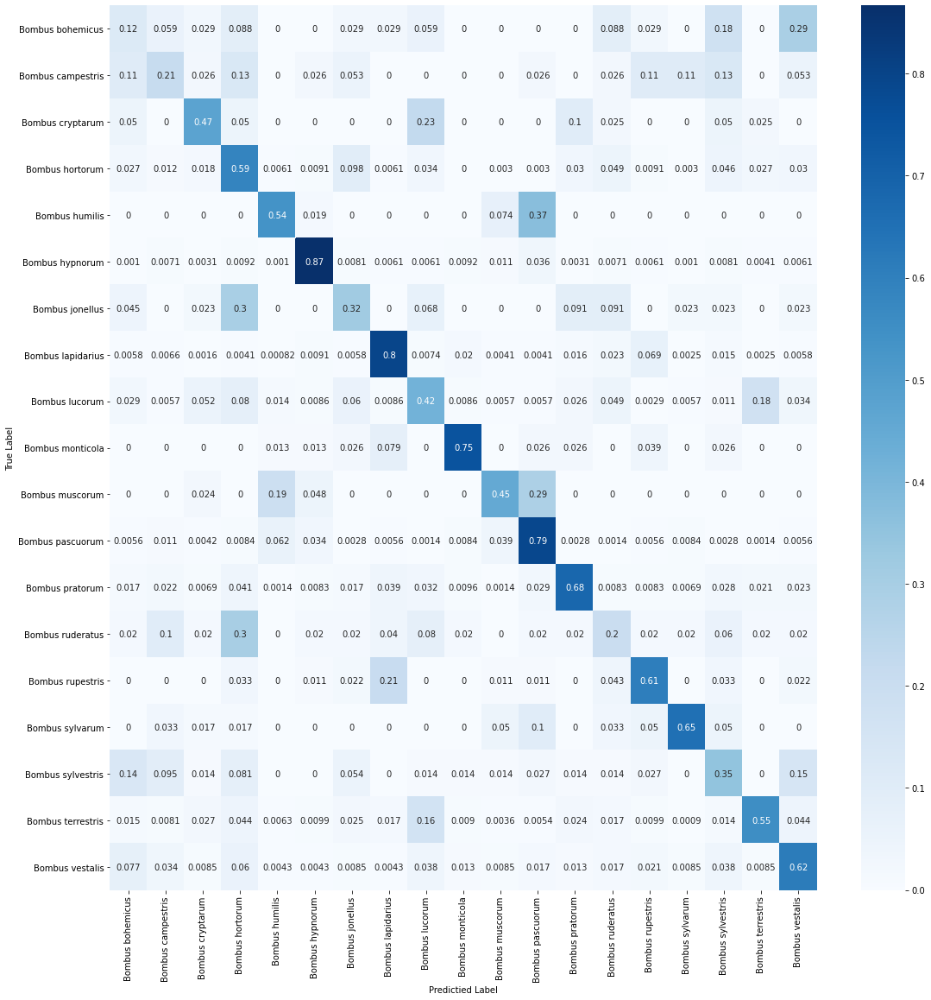

In [23]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn import decomposition
 
#pca = decomposition.PCA(n_components=40)
#pca.fit(x_val)
#x_pca = pca.transform(x_val)
#x_pca_test = pca.transform(x_test)

kernel = 1.0 * RBF(10.0)
gpc = make_pipeline(StandardScaler(), GaussianProcessClassifier(kernel=kernel, random_state=1234, n_restarts_optimizer=0))
gpc.fit(x_res, y_res)
print("model fit, hyperparameters:")
print(gpc[1].kernel_.get_params()['kernels'])
gp_pred = gpc.predict(x_test)
gp_accuracy = metrics.accuracy_score(y_test, gp_pred)
print("Accuracy Gaussian Process Classification:", gp_accuracy)
cm_gp = confusion_matrix(y_test, gp_pred, normalize='true')
figure = plt.figure(figsize=(16, 16))
sns.heatmap(cm_gp, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()

In [13]:
print(gpc[1].kernel_.get_params()['kernels'])

[100**2 * RBF(length_scale=3.94), 69.1**2 * RBF(length_scale=3.83), 92.5**2 * RBF(length_scale=4.19), 35.9**2 * RBF(length_scale=2.92), 60.2**2 * RBF(length_scale=3.57), 16.1**2 * RBF(length_scale=6.88), 85.1**2 * RBF(length_scale=3.92), 22.6**2 * RBF(length_scale=3.72), 12.9**2 * RBF(length_scale=3.06), 75.7**2 * RBF(length_scale=4.96), 74.4**2 * RBF(length_scale=4.1), 36.7**2 * RBF(length_scale=3.3), 8.25**2 * RBF(length_scale=4.08), 63.6**2 * RBF(length_scale=3.49), 47.3**2 * RBF(length_scale=3.76), 79.7**2 * RBF(length_scale=4.9), 73.1**2 * RBF(length_scale=3.56), 9.4**2 * RBF(length_scale=8.69), 46.4**2 * RBF(length_scale=3.48)]


In [21]:
print(x_res[66][1])

-6.65762


In [14]:
gp_prob = gpc.predict_proba(x_test)

In [64]:
svm_prob = linear.predict_proba(x_test)

In [45]:
print(gp_prob.shape)

(5216, 19)


In [15]:
import tensorflow_probability as tfp
ystd = np.float32(np.std(y_test, axis=0))
y32=np.float32(tf.one_hot(y_test, 19))
print(-np.mean(tfp.distributions.Normal(y32,ystd).log_prob(gp_prob)))

2.4869666


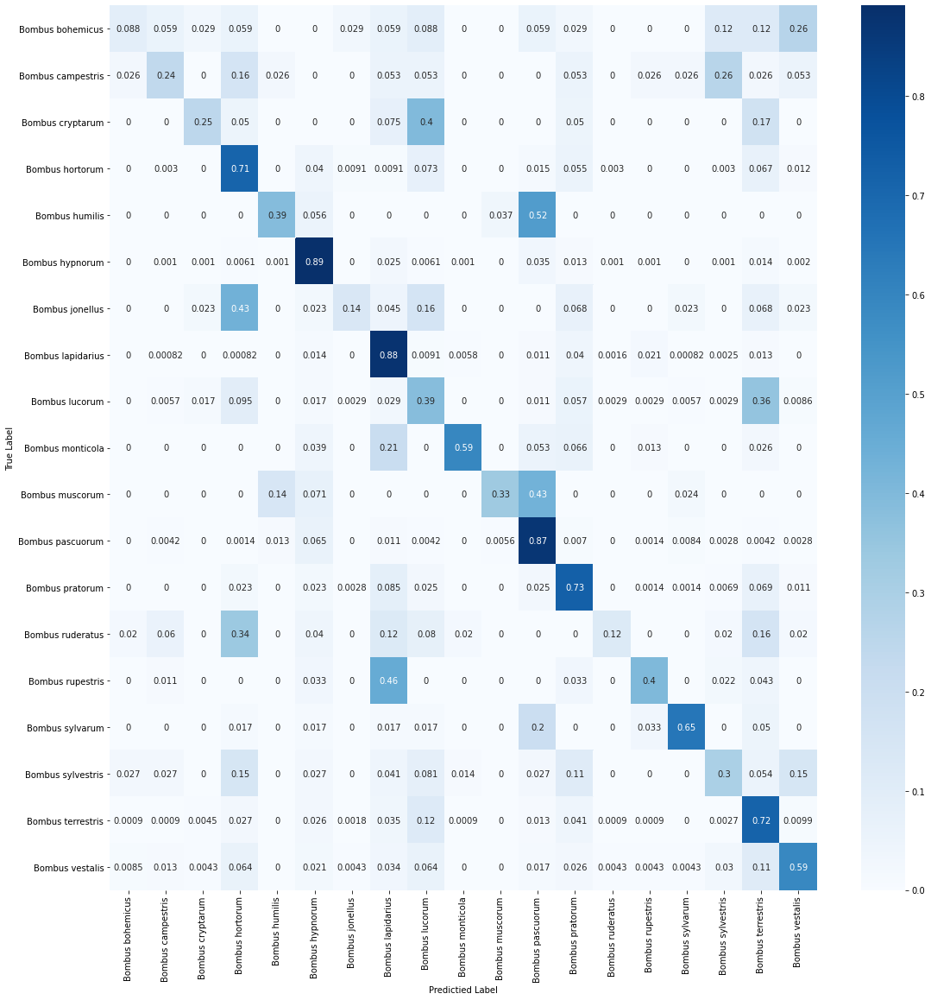

In [61]:
#poly_pred = poly.predict(x_test)
cm_svm = confusion_matrix(y_test, lin_pred, normalize='true')
figure = plt.figure(figsize=(16, 16))
sns.heatmap(cm_svm, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()

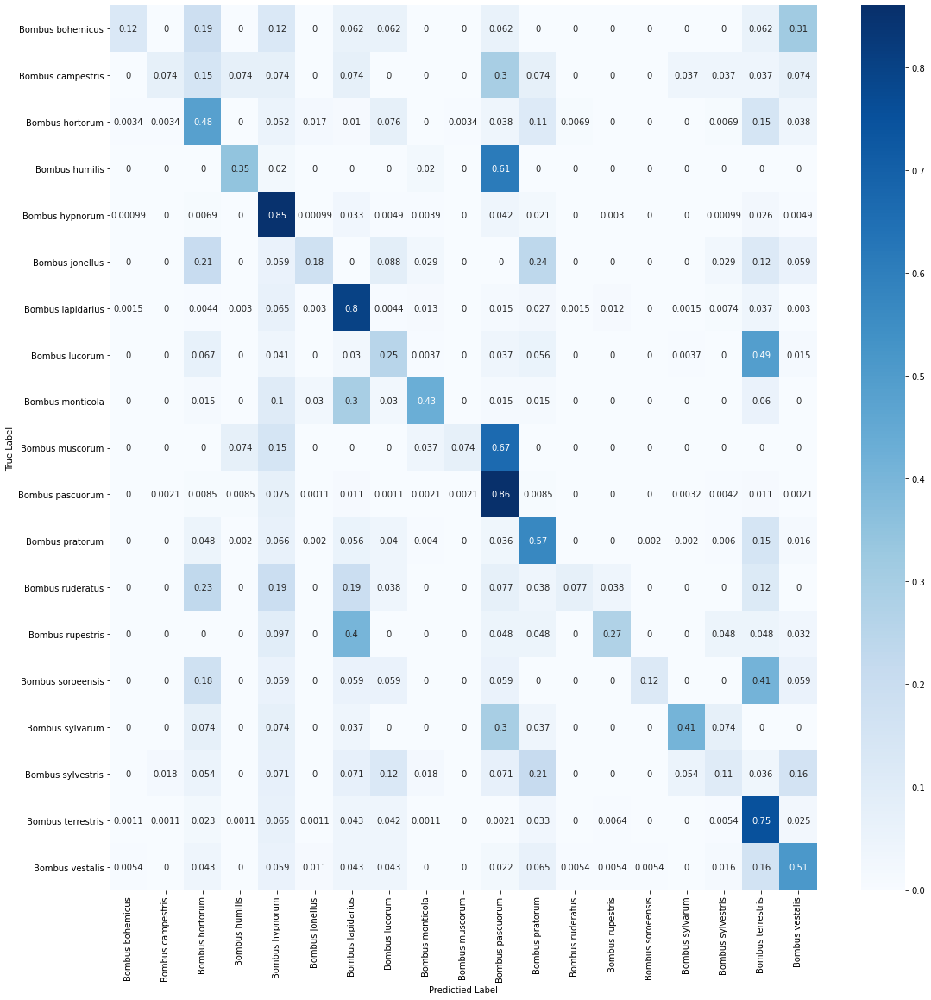

In [31]:
cm_norm = cm_poly.astype('float') / cm_poly.sum(axis=1)[:, np.newaxis]
figure = plt.figure(figsize=(16, 16))
sns.heatmap(cm_norm, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predictied Label')
plt.show()

In [ ]:
#Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

top_k = tf.math.top_k(
    predictions, k=3, sorted=True, name=None
)

predicted_indices = tf.argmax(predictions, 1)
predicted_class = tf.gather(class_names, predicted_indices)

#print('Predictions:\n', top_k[1].numpy())
#print('Labels:\n', label_batch)
#print(tf.gather(class_names, label_batch)[:9])


plt.figure(figsize=(15, 15))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predicted_indices[i]] + " (" + class_names[label_batch[i]] + ")")
  plt.axis("off")

In [32]:
from sklearn.metrics import classification_report
report = classification_report(y_test,poly_pred,target_names=class_names)
print('Classification report : \n',report)

Classification report : 
                    precision    recall  f1-score   support

 Bombus bohemicus       0.29      0.12      0.17        16
Bombus campestris       0.29      0.07      0.12        27
  Bombus hortorum       0.54      0.48      0.51       290
   Bombus humilis       0.52      0.35      0.41        49
  Bombus hypnorum       0.75      0.85      0.80      1015
  Bombus jonellus       0.29      0.18      0.22        34
Bombus lapidarius       0.74      0.80      0.77       676
   Bombus lucorum       0.38      0.25      0.30       267
 Bombus monticola       0.56      0.43      0.49        67
  Bombus muscorum       0.40      0.07      0.12        27
 Bombus pascuorum       0.82      0.86      0.84       942
  Bombus pratorum       0.63      0.57      0.60       500
 Bombus ruderatus       0.33      0.08      0.12        26
 Bombus rupestris       0.47      0.27      0.35        62
Bombus soroeensis       0.50      0.12      0.19        17
  Bombus sylvarum       0.52 

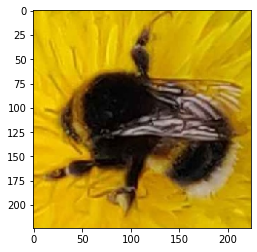

(1, 224, 224, 3)


In [7]:
from tensorflow.keras.preprocessing import image
img_path = 'D:/Jen/Documents/Dissertation/Bee_Data_UK/sample/bee4375_CROPPED.jpg'
img = image.load_img(img_path, target_size=(IMG_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
plt.show()
print(img_tensor.shape)

In [16]:
classifier = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights3')

In [37]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.ResNet50(
    input_shape=IMG_SHAPE, include_top=False, weights='imagenet'
)
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [41]:
classifier.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0     

In [40]:
classifier.get_layer('input_2input_1')._name = str('input_1')

In [48]:
from tensorflow.keras import models
from tensorflow.keras.models import Model

layer_names = ['conv2_block1_1_conv', 'conv2_block1_2_conv', 'conv2_block1_3_conv']
activations = []
for layer_name in layer_names:
    intermediate_layer_model = Model(inputs=base_model.input,
                                 outputs=base_model.get_layer(layer_name).output)
    intermediate_output = intermediate_layer_model.predict(img_tensor)
    activations.append(intermediate_output)

In [43]:
print(model.get_layer(index=4).get_layer('conv2_block1_1_conv').output)

KerasTensor(type_spec=TensorSpec(shape=(None, 56, 56, 64), dtype=tf.float32, name=None), name='conv2_block1_1_conv/BiasAdd:0', description="created by layer 'conv2_block1_1_conv'")


In [ ]:
activations = activation_model.predict(img_tensor) # Returns a list of five Numpy arrays: one array per layer activation

In [18]:
extraction_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(index=5).output)
extraction_model.summary()

Model: "model_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
Total params: 23,587,712
Trainable params: 0
Non-trainable params: 23,587,712
______________________________________________

In [ ]:
model.load_weights('D:/Jen/Documents/Dissertation/Weights/UK_weights3')

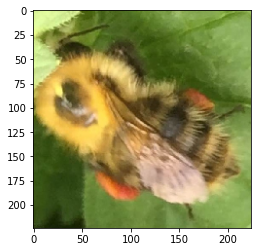

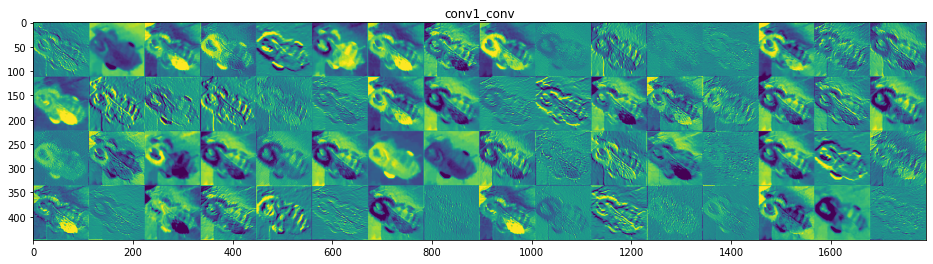

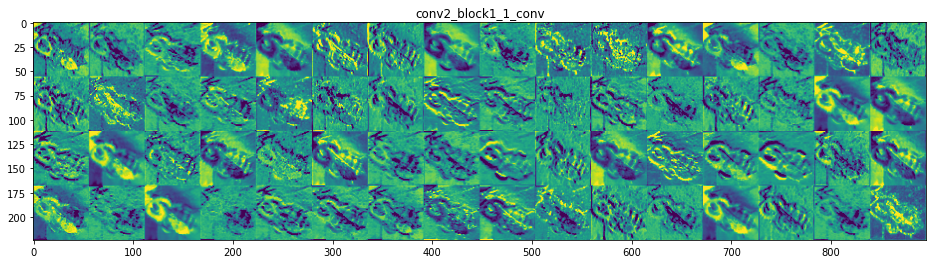

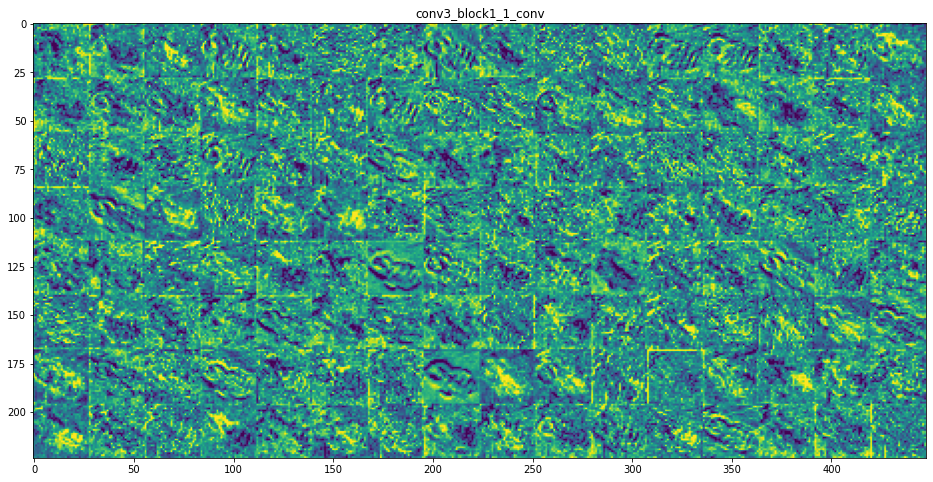

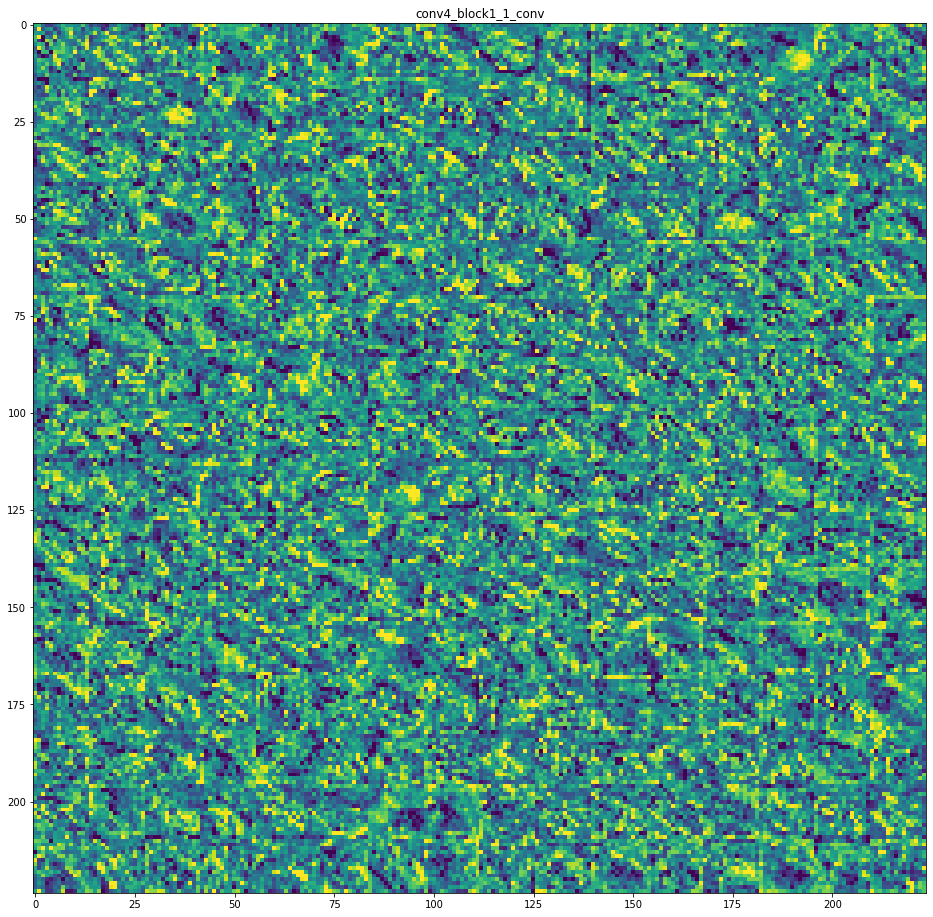

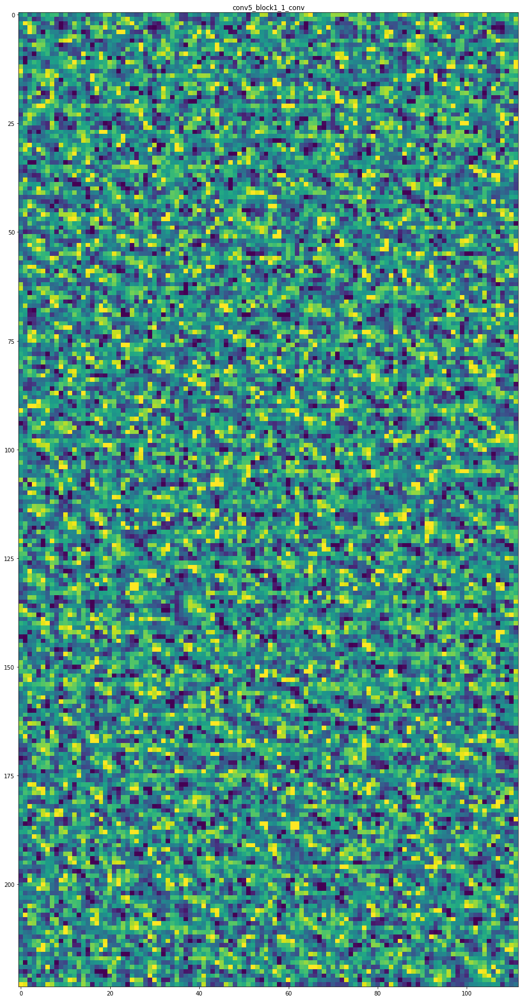

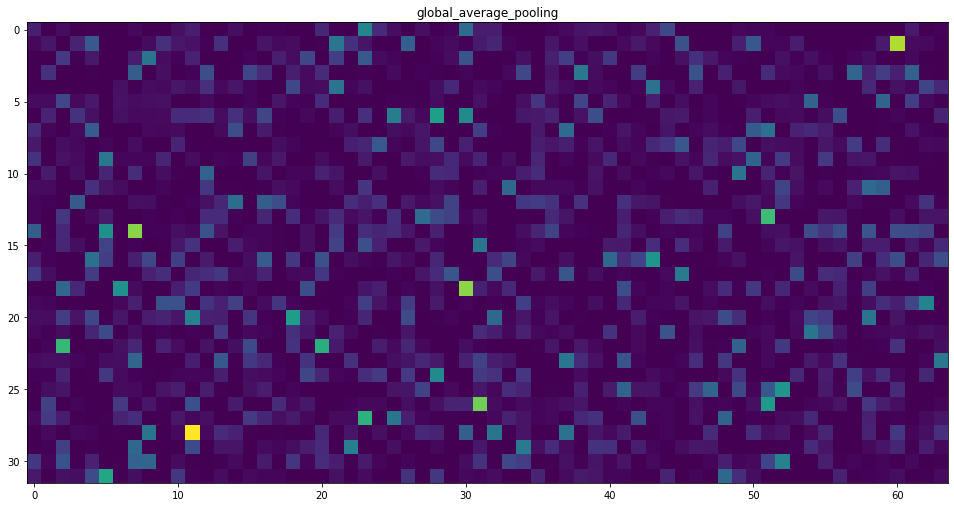

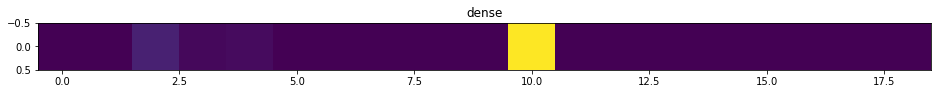

In [74]:
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

#Bee_Data_UK/Weights3/Test/Bombus pascuorum/bee157.jpg_CROPPED.jpg
#vintage-brick-red-wall.jpg
img_path = 'D:/Jen/Documents/Dissertation/Bee_Data_UK/Weights3/Test/Bombus pascuorum/bee157.jpg_CROPPED.jpg'
img = image.load_img(img_path, target_size=(IMG_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_display = img_tensor / 255.
img_tensor = tf.keras.applications.resnet.preprocess_input(img_tensor)

plt.imshow(img_display[0])
plt.show()

layer_names = ['conv1_conv', 'conv2_block1_1_conv', 'conv3_block1_1_conv', 'conv4_block1_1_conv', 'conv5_block1_1_conv']#[x.name for x in base_model.layers]
activations = []
for layer_name in layer_names:
    intermediate_layer_model = Model(inputs=base_model.input,
                                 outputs=base_model.get_layer(layer_name).output)
    intermediate_output = intermediate_layer_model.predict(img_tensor)
    activations.append(intermediate_output)
   
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps layer_names, activations
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()
gap_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(index=5).output)
gap = np.reshape(gap_model.predict(img_tensor), (-1, 64))
plt.figure(figsize=(16.5, 16))
plt.title('global_average_pooling')
plt.imshow(gap, cmap='viridis')
plt.show()

final = model.predict(img_tensor)
plt.figure(figsize=(16, 16))
plt.title('dense')
plt.imshow(final, cmap='viridis')
plt.show()

In [63]:
print(np.argmax(final))

10


In [65]:
gap.shape

(32, 64)